### Importing packages

In [3]:
import pandas as pd
import numpy as np
import spacy
from spacy import displacy
import networkx as nx


In [2]:
import matplotlib.pyplot as plt

### Downloading the English language model for spaCy

In [4]:
!python3 -m spacy download en_core_web_sm

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.8/12.8 MB 22.5 MB/s eta 0:00:0000:0100:01
✔ Download and installation successful
You can now load the package via spacy.load('en_core_web_sm')


In [5]:
# Load spacy english language model
NER = spacy.load("en_core_web_sm")

#### Steps
1. Tokenize every book into sentences
2. Label sentence with the name of characters appearing in the sentence
3. Identify a window size, to see how far two characters are from each other, if they are within the window size, a relationship exists between them.
4. With named-entity recognition, we recognize all types of entities in text like person's name, organization's name, location etc.,
5. We have already extracted all the characters names from the witcherwiki website which serves as a base for NER in our project.

### Load books

In [7]:
import os

In [8]:
# Get all the book files in the data directory
all_books = [b for b in os.scandir('data') if '.txt' in b.name]

In [9]:
all_books

[<DirEntry 'I - Blood of Elves.txt'>,
 <DirEntry 'B - The Sword of Destiny.txt'>,
 <DirEntry 'II - Times of Contempt.txt'>,
 <DirEntry 'E - something ends something begins.txt'>,
 <DirEntry 'IV - The Tower of the Swallow.txt'>,
 <DirEntry 'C - The Last Wish.txt'>,
 <DirEntry 'V - The Lady of the Lake.txt'>,
 <DirEntry 'III - Baptism of Fire.txt'>]

In [10]:
# Taking a book for analysis
book = all_books[1]
book_text = open(book).read()
book_doc = NER(book_text)

In [11]:
# Visualize identified entities
displacy.render(book_doc[0:2000], style = "ent", jupyter = True)

### Load character name

In [12]:
# Read characters
character_df = pd.read_csv("characters.csv")

In [13]:
# Remove brackets and text within brackets
# Remove brackets and text within brackets
import re 
character_df['character'] = character_df['character'].apply(lambda x: re.sub("[\(].*?[\)]", "", x)) 
character_df['character_firstname'] = character_df['character'].apply(lambda x: x.split(' ', 1)[0])

In [14]:
pd.set_option('display.max_rows', None)
character_df

,book,character,character_firstname
0,Category:Baptism of Fire characters,Adalia,Adalia
1,Category:Baptism of Fire characters,Adela,Adela
2,Category:Baptism of Fire characters,Aen Saevherne,Aen
3,Category:Baptism of Fire characters,Aevenien,Aevenien
4,Category:Baptism of Fire characters,Aglaïs,Aglaïs
5,Category:Baptism of Fire characters,Albrich,Albrich
6,Category:Baptism of Fire characters,Amavet,Amavet
7,Category:Baptism of Fire characters,Angus Bri Cri,Angus
8,Category:Baptism of Fire characters,Anna Kameny,Anna
9,Category:Baptism of Fire characters,Anzelm Aubry,Anzelm


### Get named entity list per sentence

In [15]:
sent_entity_df = []

# Loop through sentences, store named entity list for each sentence
for sent in book_doc.sents:
    entity_list = [ent.text for ent in sent.ents]
    sent_entity_df.append({"sentence": sent, "entities": entity_list})
    
sent_entity_df = pd.DataFrame(sent_entity_df)

In [16]:
sent_entity_df 

,sentence,entities
0,"(﻿The, Limits, of, the, Possible, \n, I, \n, ""...",[]
1,"("", It, 's, been, an, hour, and, a, quarter, s...",[an hour and a quarter]
2,"(He, 's, done, for, .)",[]
3,"("", \n, The, townsfolk, ,, huddled, together, ...",[]
4,"(A, fat, man, dressed, in, a, yellow, smock, \...",[]
5,"("", We, have, to, wait, a, bit, longer, ,, "", ...",[]
6,"("", Why, wait, ?, "", snorted, pimply, ,, "", Th...",[]
7,"(Anyone, goes, down, there, ,, that, 's, the, ...",[]
8,"(Have, you, forgotten, how, many, \n, have, di...",[]
9,"(What, are, we, waiting, for, ?, "", \n, "", Thi...",[]


In [17]:
# Function to filter out non-character entities
def filter_entity(ent_list, character_df):
    return [ent for ent in ent_list 
            if ent in list(character_df.character) 
            or ent in list(character_df.character_firstname)]

In [18]:
##Testing function 
filter_entity(["Geralt", "Thu", "2"], character_df)

['Geralt']

#### Function has successfully returned only the character names among the list

In [19]:
sent_entity_df['character_entities'] = sent_entity_df['entities'].apply(lambda x: filter_entity(x, character_df))

In [20]:
sent_entity_df

,sentence,entities,character_entities
0,"(﻿The, Limits, of, the, Possible, \n, I, \n, ""...",[],[]
1,"("", It, 's, been, an, hour, and, a, quarter, s...",[an hour and a quarter],[]
2,"(He, 's, done, for, .)",[],[]
3,"("", \n, The, townsfolk, ,, huddled, together, ...",[],[]
4,"(A, fat, man, dressed, in, a, yellow, smock, \...",[],[]
5,"("", We, have, to, wait, a, bit, longer, ,, "", ...",[],[]
6,"("", Why, wait, ?, "", snorted, pimply, ,, "", Th...",[],[]
7,"(Anyone, goes, down, there, ,, that, 's, the, ...",[],[]
8,"(Have, you, forgotten, how, many, \n, have, di...",[],[]
9,"(What, are, we, waiting, for, ?, "", \n, "", Thi...",[],[]


In [21]:
# Filter out sentences that don't have any character entities
sent_entity_df_filtered = sent_entity_df[sent_entity_df['character_entities'].map(len) > 0]
sent_entity_df_filtered.head(10)

,sentence,entities,character_entities
85,"(I, am, Geralt, of, Rivia, .)",[Geralt of Rivia],[Geralt of Rivia]
95,"(Is, there, anything, keeping, you, in, this, ...",[Geralt of Rivia],[Geralt of Rivia]
102,"("", \n, "", Borch, ,, "", replied, Geralt, ,, wh...","[Borch, Geralt]",[Geralt]
106,"("", \n, "", There, are, some, ,, "", Geralt, rep...",[Geralt],[Geralt]
110,"("", \n, Geralt, took, off, a, glove, and, shoo...",[Geralt],[Geralt]
140,"("", I, forgot, ,, "", Three, Jackdaws, winked, ...","[Three Jackdaws, Geralt]",[Geralt]
151,"(Geralt, loosened, his, belt, ,, removed, his,...",[Geralt],[Geralt]
157,"("", Do, the, girls, speak, the, common, langua...",[Geralt],[Geralt]
160,"(How, 's, your, soup, ,, Geralt, ?, "", \n, "", ...","[Geralt, Hmm]",[Geralt]
169,"(Yet, there, is, a, certain, principal, underl...",[Geralt],[Geralt]


In [22]:
# Take only first name of characters

sent_entity_df_filtered['character_entities'] = sent_entity_df_filtered['character_entities'].apply(lambda x: [item.split()[0] 
                                                                                                               for item in x])

/var/folders/bz/9s4mdqhj1ys8_bmyym5162tw0000gn/T/ipykernel_6494/856139762.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sent_entity_df_filtered['character_entities'] = sent_entity_df_filtered['character_entities'].apply(lambda x: [item.split()[0]


In [23]:
pd.reset_option('^display.', silent=True)
sent_entity_df_filtered

,sentence,entities,character_entities
85,"(I, am, Geralt, of, Rivia, .)",[Geralt of Rivia],[Geralt]
95,"(Is, there, anything, keeping, you, in, this, ...",[Geralt of Rivia],[Geralt]
102,"("", \n, "", Borch, ,, "", replied, Geralt, ,, wh...","[Borch, Geralt]",[Geralt]
106,"("", \n, "", There, are, some, ,, "", Geralt, rep...",[Geralt],[Geralt]
110,"("", \n, Geralt, took, off, a, glove, and, shoo...",[Geralt],[Geralt]
...,...,...,...
11309,"(He, only, saw, black, -, gloved, hands, squee...",[Ciri],[Ciri]
11311,"(Oh, ,, Geralt, !)",[Geralt],[Geralt]
11316,"(Say, it, ,, Geralt, !)",[Geralt],[Geralt]
11317,"(Forever, !, Say, it, !, "", \n, "", Forever, ,,...","[Forever, Ciri, Geralt]","[Ciri, Geralt]"


#### Here we can see , only first name of entities is being considered, "Geralt of Rivia" is considered as "Geralt"

### Create relationships

In [24]:
window_size = 5
relationships = []

for i in range(sent_entity_df_filtered.index[-1]):
    end_i = min(i+5, sent_entity_df_filtered.index[-1])
    char_list = sum((sent_entity_df_filtered.loc[i: end_i].character_entities), [])
    
    # Remove duplicated characters that are next to each other
    char_unique = [char_list[i] for i in range(len(char_list)) 
                   if (i==0) or char_list[i] != char_list[i-1]]
    
    if len(char_unique) > 1:
        for idx, a in enumerate(char_unique[:-1]):
            b = char_unique[idx + 1]
            relationships.append({"source": a, "target": b})

In [25]:
relationship_df = pd.DataFrame(relationships)

In [26]:
pd.set_option('display.max_rows', None)
relationship_df

,source,target
0,Geralt,Niedamir
1,Geralt,Niedamir
2,Geralt,Niedamir
3,Niedamir,Geralt
4,Niedamir,Geralt
5,Niedamir,Geralt
6,Geralt,Niedamir
7,Geralt,Niedamir
8,Niedamir,Geralt
9,Niedamir,Geralt


In [27]:
# Sort the cases with a->b and b->a
relationship_df = pd.DataFrame(np.sort(relationship_df.values, axis = 1), columns = relationship_df.columns)
relationship_df

,source,target
0,Geralt,Niedamir
1,Geralt,Niedamir
2,Geralt,Niedamir
3,Geralt,Niedamir
4,Geralt,Niedamir
5,Geralt,Niedamir
6,Geralt,Niedamir
7,Geralt,Niedamir
8,Geralt,Niedamir
9,Geralt,Niedamir


In [28]:
relationship_df["value"] = 1
relationship_df = relationship_df.groupby(["source","target"], sort=False, as_index=False).sum()

In [29]:
relationship_df.head(10)

,source,target,value
0,Geralt,Niedamir,52
1,Eyck,Geralt,51
2,Dorregaray,Geralt,30
3,Dorregaray,Yennefer,44
4,Geralt,Yarpen,24
5,Geralt,Gyllenstiern,32
6,Boholt,Niedamir,21
7,Boholt,Geralt,39
8,Geralt,Kennet,2
9,Boholt,Kennet,8


### Graph Analysis and Visualization

In [31]:
# Create a graph from a pandas dataframe
G = nx.from_pandas_edgelist(relationship_df, 
                            source = "source", 
                            target = "target", 
                            edge_attr = "value", 
                            create_using = nx.Graph())

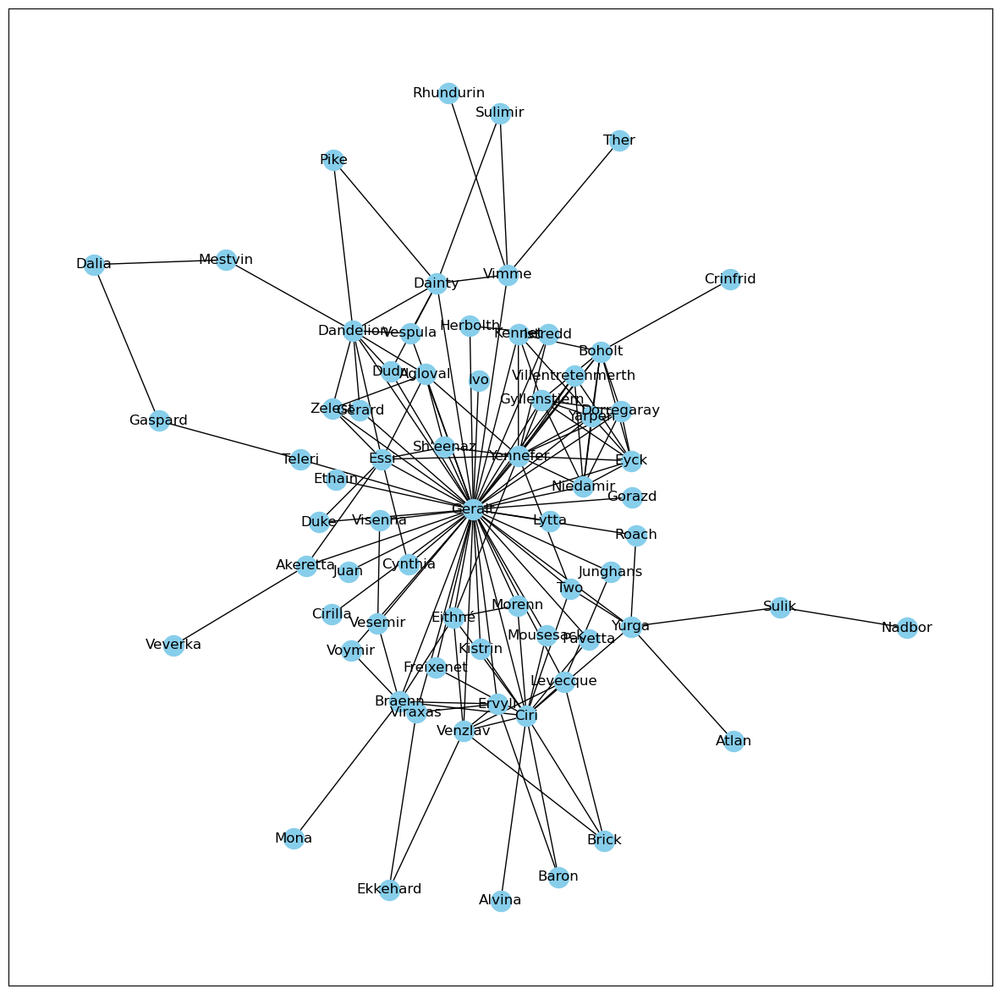

In [34]:
#### Graph visualization - network x
plt.figure(figsize=(15,15))
pos = nx.kamada_kawai_layout(G)
nx.draw_networkx(G, with_labels=True, node_color='skyblue', edge_cmap=plt.cm.Blues, pos = pos)
plt.show()

### Graph visualization - Pyvis

In [35]:
from pyvis.network import Network

In [36]:
from pyvis.network import Network
net = Network(notebook = True, width="1000px", height="700px", bgcolor='#222222', font_color='white')

node_degree = dict(G.degree)

#Setting up node size attribute
nx.set_node_attributes(G, node_degree, 'size')

net.from_nx(G)
net.show("witcher.html")

witcher.html


#### From the above network visualization, we can interpret that Geralt, Yennefer and Ciri are the top 3 characters in the Witcher series. (based on their node size)(based on degree centrality , where nodes which have the highest number of connections are the important nodes)

#### Other centrality measures
#### Best Closeness centrality - how long it will take to spread information to all other nodes sequentially
#### Highest Betweeness centrality - measures how often a node acts as a bridge along the shortest path between two other nodes

### Determining the most important character in the Witcher series

In [39]:
# Degree centrality
degree_dict = nx.degree_centrality(G)
degree_dict

{'Geralt': 0.7462686567164178,
 'Niedamir': 0.11940298507462686,
 'Eyck': 0.11940298507462686,
 'Dorregaray': 0.08955223880597014,
 'Yennefer': 0.22388059701492538,
 'Yarpen': 0.1044776119402985,
 'Gyllenstiern': 0.11940298507462686,
 'Boholt': 0.13432835820895522,
 'Kennet': 0.07462686567164178,
 'Crinfrid': 0.014925373134328358,
 'Villentretenmerth': 0.05970149253731343,
 'Istredd': 0.04477611940298507,
 'Herbolth': 0.029850746268656716,
 'Ivo': 0.014925373134328358,
 'Two': 0.05970149253731343,
 'Dandelion': 0.14925373134328357,
 'Pike': 0.029850746268656716,
 'Dainty': 0.1044776119402985,
 'Vespula': 0.04477611940298507,
 'Vimme': 0.07462686567164178,
 'Sulimir': 0.029850746268656716,
 'Ther': 0.014925373134328358,
 'Rhundurin': 0.014925373134328358,
 'Dudu': 0.04477611940298507,
 "Sh'eenaz": 0.05970149253731343,
 'Agloval': 0.08955223880597014,
 'Gaspard': 0.029850746268656716,
 'Teleri': 0.029850746268656716,
 'Dalia': 0.029850746268656716,
 'Mestvin': 0.029850746268656716,
 'Ess

<Axes: >

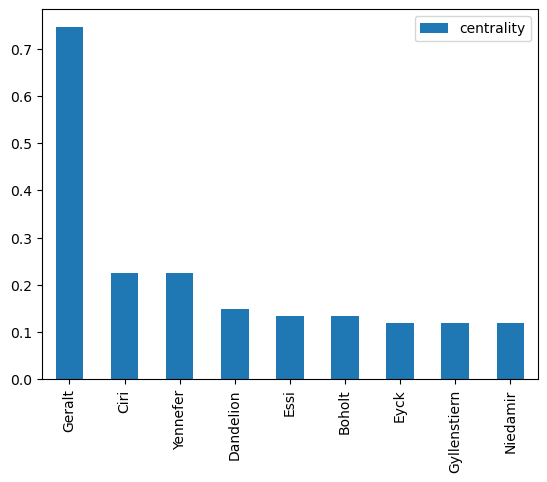

In [40]:
degree_df = pd.DataFrame.from_dict(degree_dict, orient='index', columns=['centrality'])
# Plot top 10 nodes
degree_df.sort_values('centrality', ascending=False)[0:9].plot(kind="bar")

#### Based on degree centrality , where nodes which have the highest number of connections are the important nodes.From the above bar plot, we can interpret that Geralt, Yennefer and Ciri are the top 3 characters in the Witcher series. 

<Axes: >

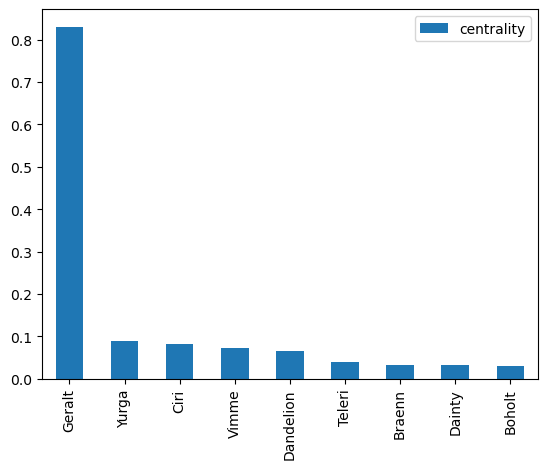

In [44]:
# Betweenness centrality
betweenness_dict = nx.betweenness_centrality(G)
betweenness_df = pd.DataFrame.from_dict(betweenness_dict, orient='index', columns=['centrality'])
# Plot top 10 nodes
betweenness_df.sort_values('centrality', ascending=False)[0:9].plot(kind="bar")

#### Based on betweeness centrality ,Geralt, Yurga and Ciri are the top characters that act as a bridge along the shortest path between two other nodes.

<Axes: >

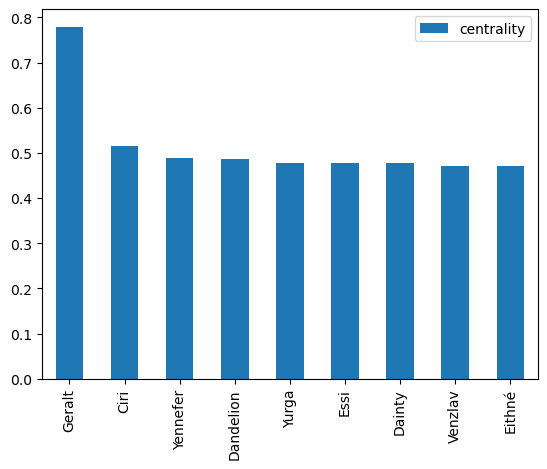

In [43]:
# Closeness centrality
closeness_dict = nx.closeness_centrality(G)
closeness_df = pd.DataFrame.from_dict(closeness_dict, orient='index', columns=['centrality'])
# Plot top 10 nodes
closeness_df.sort_values('centrality', ascending=False)[0:9].plot(kind="bar")

#### Closeness centrality yielded the same results as degree centrality

In [46]:
# Save centrality measures
nx.set_node_attributes(G, degree_dict, 'degree_centrality')
nx.set_node_attributes(G, betweenness_dict, 'betweenness_centrality')
nx.set_node_attributes(G, closeness_dict, 'closeness_centrality')

#### Community detection algorithms are used to evaluate how groups of nodes are clustered or partitioned as well as their tendency to strengthen or break apart

##### From terminal install the python-louvain library

In [49]:
!pip install python-louvain

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 204.6/204.6 kB 2.9 MB/s eta 0:00:00a 0:00:01
  Preparing metadata (setup.py) ... done
  Created wheel for python-louvain: filename=python_louvain-0.16-py3-none-any.whl size=9389 sha256=f7331d70746fbacd0f246a4c9ee8c17368aefbc0fb1f5be4dee38a20e8f3cffe
  Stored in directory: /Users/anishachitturu/Library/Caches/pip/wheels/e0/2c/33/8b5604f69c4a6ed10fb867d51173c03f666920c7c8bbcedbaa
Successfully built python-louvain


In [51]:
import community as community_louvain

In [52]:
communities = community_louvain.best_partition(G)

In [53]:
communities

{'Geralt': 4,
 'Niedamir': 1,
 'Eyck': 1,
 'Dorregaray': 1,
 'Yennefer': 1,
 'Yarpen': 1,
 'Gyllenstiern': 1,
 'Boholt': 1,
 'Kennet': 1,
 'Crinfrid': 1,
 'Villentretenmerth': 1,
 'Istredd': 4,
 'Herbolth': 4,
 'Ivo': 4,
 'Two': 2,
 'Dandelion': 3,
 'Pike': 3,
 'Dainty': 3,
 'Vespula': 3,
 'Vimme': 3,
 'Sulimir': 3,
 'Ther': 3,
 'Rhundurin': 3,
 'Dudu': 3,
 "Sh'eenaz": 4,
 'Agloval': 4,
 'Gaspard': 3,
 'Teleri': 3,
 'Dalia': 3,
 'Mestvin': 3,
 'Essi': 4,
 'Gerard': 3,
 'Zelest': 4,
 'Duke': 4,
 'Akeretta': 4,
 'Veverka': 4,
 'Ethain': 4,
 'Juan': 4,
 'Cynthia': 4,
 'Braenn': 0,
 'Ciri': 0,
 'Ervyll': 0,
 'Eithné': 0,
 'Voymir': 0,
 'Kistrin': 0,
 'Alvina': 0,
 'Vesemir': 4,
 'Cirilla': 4,
 'Freixenet': 0,
 'Venzlav': 0,
 'Ekkehard': 0,
 'Viraxas': 0,
 'Morenn': 0,
 'Mona': 0,
 'Pavetta': 0,
 'Baron': 0,
 'Junghans': 0,
 'Brick': 0,
 'Levecque': 0,
 'Mousesack': 0,
 'Yurga': 2,
 'Visenna': 4,
 'Atlan': 2,
 'Lytta': 4,
 'Gorazd': 4,
 'Roach': 2,
 'Nadbor': 2,
 'Sulik': 2}

In [54]:
nx.set_node_attributes(G, communities, 'group')

In [55]:
com_net = Network(notebook = True, width="1000px", height="700px", bgcolor='#222222', font_color='white')
com_net.from_nx(G)
com_net.show("witcher_communities.html")

witcher_communities.html


#### We can interpret that Geralt, Ciri and Yennefer are in different communities, it is predictable as throughout the series Geralt and Ciri are finding each other

In [56]:
def ner(file_name):
    """
    Function to process text from a text file (.txt) using Spacy.
    
    Params:
    file_name -- name of a txt file as string
    
    Returns:
    a processed doc file using Spacy English language model
    
    """
    # Load spacy English languague model
    nlp = spacy.load("en_core_web_sm")
    book_text = open(file_name).read()
    book_doc = nlp(book_text)
    
    return book_doc

In [57]:
def get_ne_list_per_sentence(spacy_doc):
    """
    Get a list of entites per sentence of a Spacy document and store in a dataframe.
    
    Params:
    spacy_doc -- a Spacy processed document
    
    Returns:
    a dataframe containing the sentences and corresponding list of recognised named entities       in the sentences
    """
    
    sent_entity_df = []

    # Loop through sentences, store named entity list for each sentence
    for sent in spacy_doc.sents:
        entity_list = [ent.text for ent in sent.ents]
        sent_entity_df.append({"sentence": sent, "entities": entity_list})

    sent_entity_df = pd.DataFrame(sent_entity_df)
    
    return sent_entity_df

In [58]:
def filter_entity(ent_list, character_df):
    """
    Function to filter out non-character entities.
    
    Params:
    ent_list -- list of entities to be filtered
    character_df -- a dataframe contain characters' names and characters' first names
    
    Returns:
    a list of entities that are characters (matching by names or first names).
    
    """
    return [ent for ent in ent_list 
            if ent in list(character_df.character) 
            or ent in list(character_df.character_firstname)]

In [59]:
def create_relationships(df, window_size):
    
    """
    Create a dataframe of relationships based on the df dataframe (containing lists of chracters per sentence) and the window size of n sentences.
    
    Params:
    df -- a dataframe containing a column called character_entities with the list of chracters for each sentence of a document.
    window_size -- size of the windows (number of sentences) for creating relationships between two adjacent characters in the text.
    
    Returns:
    a relationship dataframe containing 3 columns: source, target, value.
    
    """
    
    relationships = []

    for i in range(df.index[-1]):
        end_i = min(i + window_size, df.index[-1])
        char_list = sum((df.loc[i: end_i].character_entities), [])

        # Remove duplicated characters that are next to each other
        char_unique = [char_list[i] for i in range(len(char_list)) 
                       if (i==0) or char_list[i] != char_list[i-1]]

        if len(char_unique) > 1:
            for idx, a in enumerate(char_unique[:-1]):
                b = char_unique[idx + 1]
                relationships.append({"source": a, "target": b})
           
    relationship_df = pd.DataFrame(relationships)
    # Sort the cases with a->b and b->a
    relationship_df = pd.DataFrame(np.sort(relationship_df.values, axis = 1), 
                                   columns = relationship_df.columns)
    relationship_df["value"] = 1
    relationship_df = relationship_df.groupby(["source","target"], 
                                              sort=False, 
                                              as_index=False).sum()
                
    return relationship_df

### Evolution of characters' importance considering all the books

In [62]:
# Initialize empty list for graphs from books
books_graph = []
all_books = [b for b in os.scandir('data') if '.txt' in b.name]
# Load spacy English languague model
nlp = spacy.load("en_core_web_sm")

# Sort dir entries by name
all_books.sort(key=lambda x: x.name)

In [63]:
# Loop through book list and create graphs
for book in all_books:
    book_text = ner(book)
    
    # Get list of entities per sentences
    sent_entity_df = get_ne_list_per_sentence(book_text)
    
    # Select only character entities
    sent_entity_df['character_entities'] = sent_entity_df['entities'].apply(lambda x: filter_entity(x, character_df))

    # Filter out sentences that don't have any character entities
    sent_entity_df_filtered = sent_entity_df[sent_entity_df['character_entities'].map(len) > 0]
    
    # Take only first name of characters
    sent_entity_df_filtered['character_entities'] = sent_entity_df_filtered['character_entities'].apply(lambda x: [item.split()[0] 
                                                                                                               for item in x])

    # Create relationship df
    relationship_df = create_relationships(df = sent_entity_df_filtered, window_size = 5)                                                                                                               
    
    # Create a graph from a pandas dataframe
    G = nx.from_pandas_edgelist(relationship_df, 
                                source = "source", 
                                target = "target", 
                                edge_attr = "value", 
                                create_using = nx.Graph())     
    
    books_graph.append(G) 

/var/folders/bz/9s4mdqhj1ys8_bmyym5162tw0000gn/T/ipykernel_6494/4223697425.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sent_entity_df_filtered['character_entities'] = sent_entity_df_filtered['character_entities'].apply(lambda x: [item.split()[0]
/var/folders/bz/9s4mdqhj1ys8_bmyym5162tw0000gn/T/ipykernel_6494/4223697425.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sent_entity_df_filtered['character_entities'] = sent_entity_df_filtered['character_entities'].apply(lambda x: [item.split()[0]
/v

<Axes: >

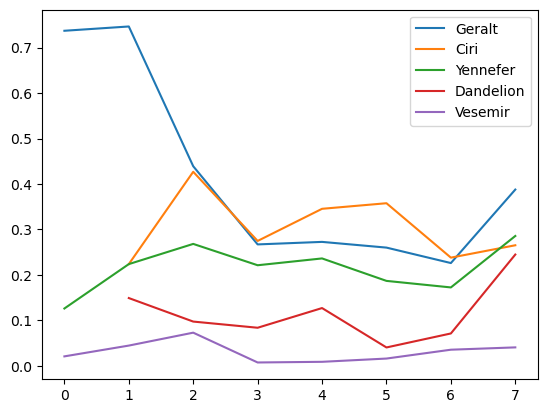

In [65]:
# Creating a list of degree centrality of all the books
evol = [nx.degree_centrality(book) for book in books_graph]

# Creating a DataFrame from the list of degree centralities in all the books
degree_evol_df = pd.DataFrame.from_records(evol)

# Plotting the degree centrality evolution of 5 main characters
degree_evol_df[["Geralt", "Ciri", "Yennefer", "Dandelion", "Vesemir"]].plot()

#### We can see that Geralt has been the main character since the first book followed by Ciri